# Install COBRApy

In [2]:
!pip install cobra

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.6/45.6 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.4/75.4 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.3/138.3 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 59.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.2/112.2 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 62.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 88.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 485.6/485.6 kB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 6.5 MB/s eta 0:00:00
  Attempting uninstall

# Figure 1
## Biological Networks

### Drawing model with nodes and edges for metabolic pathway

#### Toy Model

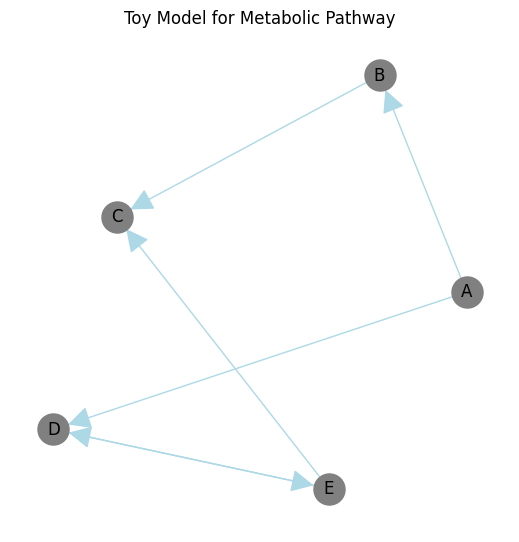

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Create a directed graph
G = nx.DiGraph()

# Add metabolites (species) to the graph
G.add_node('A', type='metabolite')
G.add_node('B', type='metabolite')
G.add_node('C', type='metabolite')
G.add_node('D', type='metabolite')
G.add_node('E', type='metabolite')

# Add reactions as edges
G.add_edge('A', 'B')
G.add_edge('B', 'C')
G.add_edge('A', 'D')
G.add_edge('D', 'E')
G.add_edge('E', 'D')
G.add_edge('E', 'C')

# Set the positions of nodes for a hierarchical layout
pos = nx.kamada_kawai_layout(G)

# Draw the graph
plt.figure(figsize=(5, 5))
nx.draw(G, pos, with_labels=True, node_color='gray', node_size=500, edge_color='lightblue', arrowsize=35)

plt.title('Toy Model for Metabolic Pathway')
plt.axis('off')
plt.show()


### Model when compartment of metabolites are cytosol

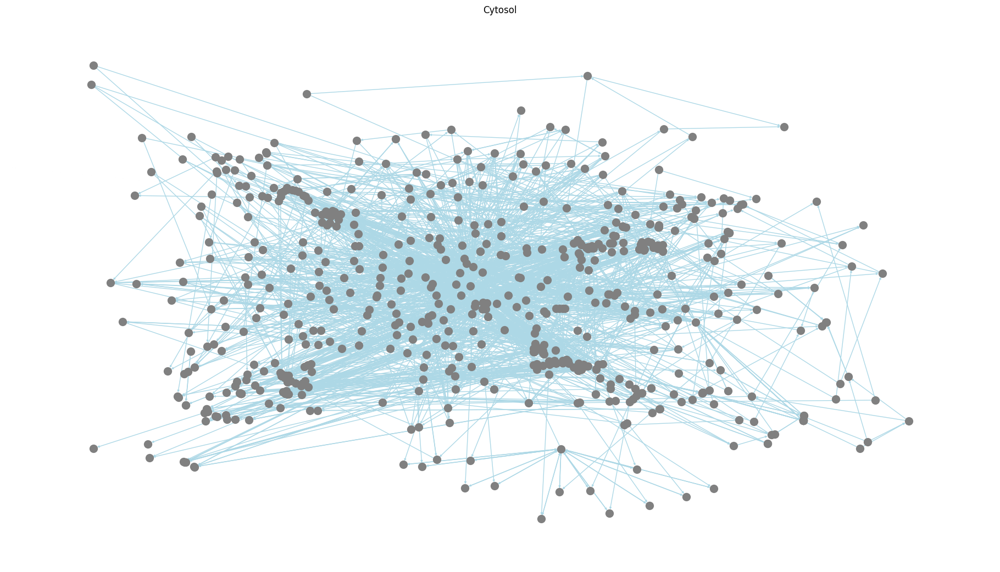

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import libsbml

# Load the SBML model
sbml_file = "model_bm_6.sbml"
document = libsbml.readSBML(sbml_file)
model = document.getModel()

# Create a directed graph
G = nx.DiGraph()

# Add metabolites (species) to the graph
for species in model.getListOfSpecies():
    compartment = species.getCompartment()
    if compartment == 'c':
        G.add_node(species.getId(), type='metabolite')

# Add reactions as edges
for reaction in model.getListOfReactions():
    for reactant in reaction.getListOfReactants():
        reactant_species = reactant.getSpecies()
        for product in reaction.getListOfProducts():
            product_species = product.getSpecies()
            if G.has_node(reactant_species) and G.has_node(product_species):
                G.add_edge(reactant_species, product_species)

# Set the positions of nodes for a hierarchical layout
pos = nx.kamada_kawai_layout(G)

# Draw the graph
plt.figure(figsize=(18, 10))
nx.draw(G, pos, with_labels=False, node_color='gray', node_size=100, edge_color='lightblue', arrowsize=5)

plt.title('Cytosol')
plt.axis('off')
plt.show()

### Model when compartment of metabolites are Wolbachia

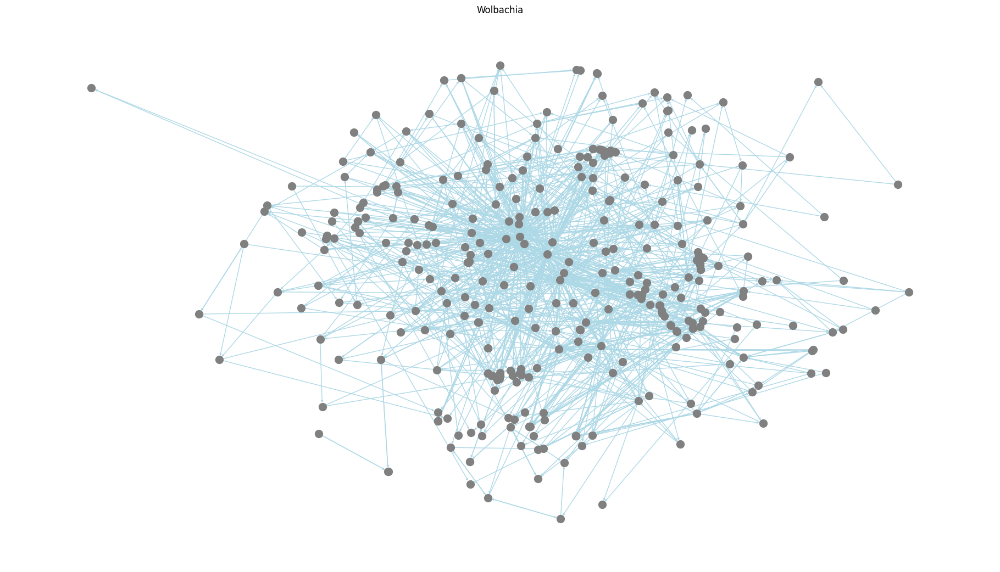

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import libsbml

# Load the SBML model
sbml_file = "model_bm_6.sbml"
document = libsbml.readSBML(sbml_file)
model = document.getModel()

# Create a directed graph
G = nx.DiGraph()

# Add metabolites (species) to the graph
for species in model.getListOfSpecies():
    compartment = species.getCompartment()
    if compartment == 'w':
        G.add_node(species.getId(), type='metabolite')

# Add reactions as edges
for reaction in model.getListOfReactions():
    for reactant in reaction.getListOfReactants():
        reactant_species = reactant.getSpecies()
        for product in reaction.getListOfProducts():
            product_species = product.getSpecies()
            if G.has_node(reactant_species) and G.has_node(product_species):
                G.add_edge(reactant_species, product_species)

# Set the positions of nodes for a hierarchical layout
pos = nx.kamada_kawai_layout(G)

# Draw the graph
plt.figure(figsize=(18, 10))
nx.draw(G, pos, with_labels=False, node_color='gray', node_size=100, edge_color='lightblue', arrowsize=5)

plt.title('Wolbachia')
plt.axis('off')
plt.show()

### Model when compartment of metabolites are mitochondria

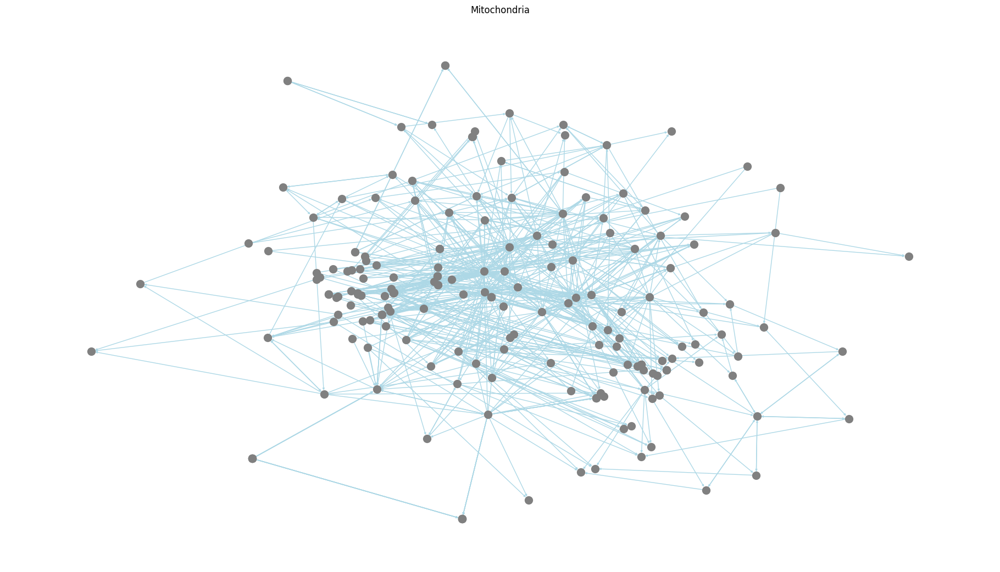

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import libsbml

# Load the SBML model
sbml_file = "model_bm_6.sbml"
document = libsbml.readSBML(sbml_file)
model = document.getModel()

# Create a directed graph
G = nx.DiGraph()

# Add metabolites (species) to the graph
for species in model.getListOfSpecies():
    compartment = species.getCompartment()
    if compartment == 'm':
        G.add_node(species.getId(), type='metabolite')

# Add reactions as edges
for reaction in model.getListOfReactions():
    for reactant in reaction.getListOfReactants():
        reactant_species = reactant.getSpecies()
        for product in reaction.getListOfProducts():
            product_species = product.getSpecies()
            if G.has_node(reactant_species) and G.has_node(product_species):
                G.add_edge(reactant_species, product_species)

# Set the positions of nodes for a hierarchical layout
pos = nx.kamada_kawai_layout(G)

# Draw the graph
plt.figure(figsize=(18, 10))
nx.draw(G, pos, with_labels=False, node_color='gray', node_size=100, edge_color='lightblue', arrowsize=5)

plt.title('Mitochondria')
plt.axis('off')
plt.show()

### Drawing with Different Layouts

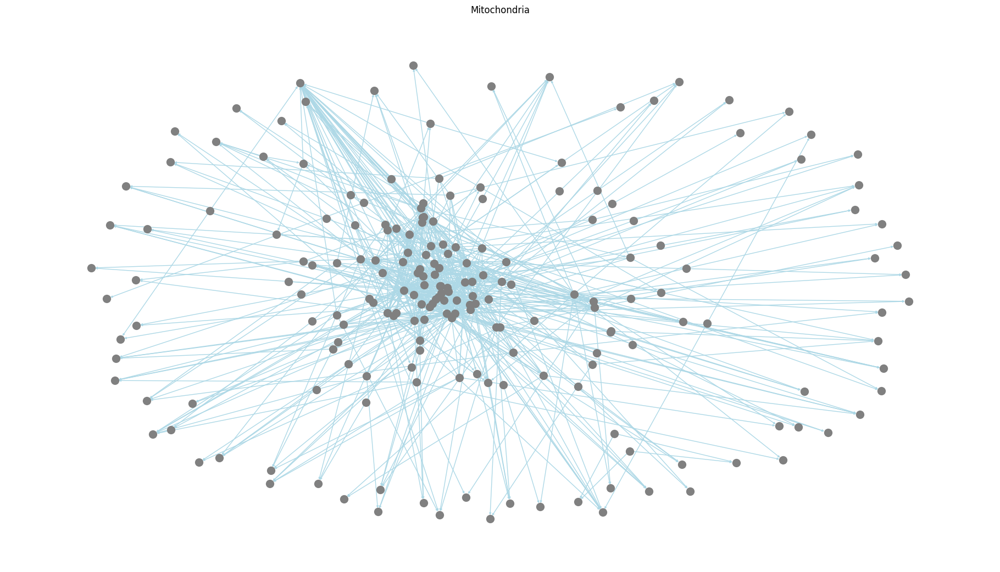

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import libsbml

# Load the SBML model
sbml_file = "model_bm_6.sbml"
document = libsbml.readSBML(sbml_file)
model = document.getModel()

# Create a directed graph
G = nx.DiGraph()

# Add metabolites (species) to the graph
for species in model.getListOfSpecies():
    compartment = species.getCompartment()
    if compartment == 'm':
        G.add_node(species.getId(), type='metabolite')

# Add reactions as edges
for reaction in model.getListOfReactions():
    for reactant in reaction.getListOfReactants():
        reactant_species = reactant.getSpecies()
        for product in reaction.getListOfProducts():
            product_species = product.getSpecies()
            if G.has_node(reactant_species) and G.has_node(product_species):
                G.add_edge(reactant_species, product_species)

# Set the positions of nodes for a hierarchical layout
pos = nx.spring_layout(G)

# Draw the graph
plt.figure(figsize=(18, 10))
nx.draw(G, pos, with_labels=False, node_color='gray', node_size=100, edge_color='lightblue', arrowsize=5)

plt.title('Mitochondria')
plt.axis('off')
plt.show()

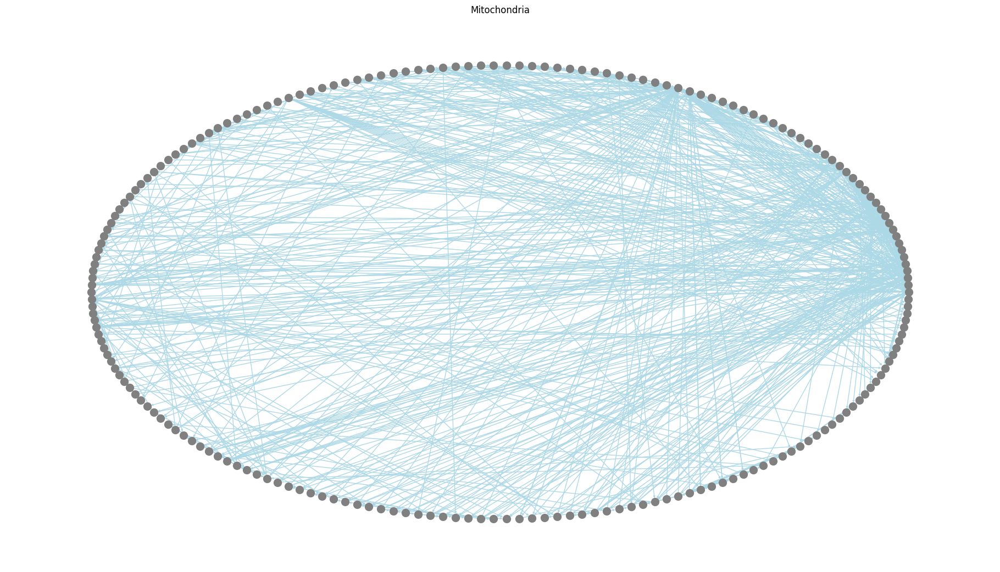

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import libsbml

# Load the SBML model
sbml_file = "model_bm_6.sbml"
document = libsbml.readSBML(sbml_file)
model = document.getModel()

# Create a directed graph
G = nx.DiGraph()

# Add metabolites (species) to the graph
for species in model.getListOfSpecies():
    compartment = species.getCompartment()
    if compartment == 'm':
        G.add_node(species.getId(), type='metabolite')

# Add reactions as edges
for reaction in model.getListOfReactions():
    for reactant in reaction.getListOfReactants():
        reactant_species = reactant.getSpecies()
        for product in reaction.getListOfProducts():
            product_species = product.getSpecies()
            if G.has_node(reactant_species) and G.has_node(product_species):
                G.add_edge(reactant_species, product_species)

# Set the positions of nodes for a hierarchical layout
pos = nx.circular_layout(G)

# Draw the graph
plt.figure(figsize=(18, 10))
nx.draw(G, pos, with_labels=False, node_color='gray', node_size=100, edge_color='lightblue', arrowsize=5)

plt.title('Mitochondria')
plt.axis('off')
plt.show()

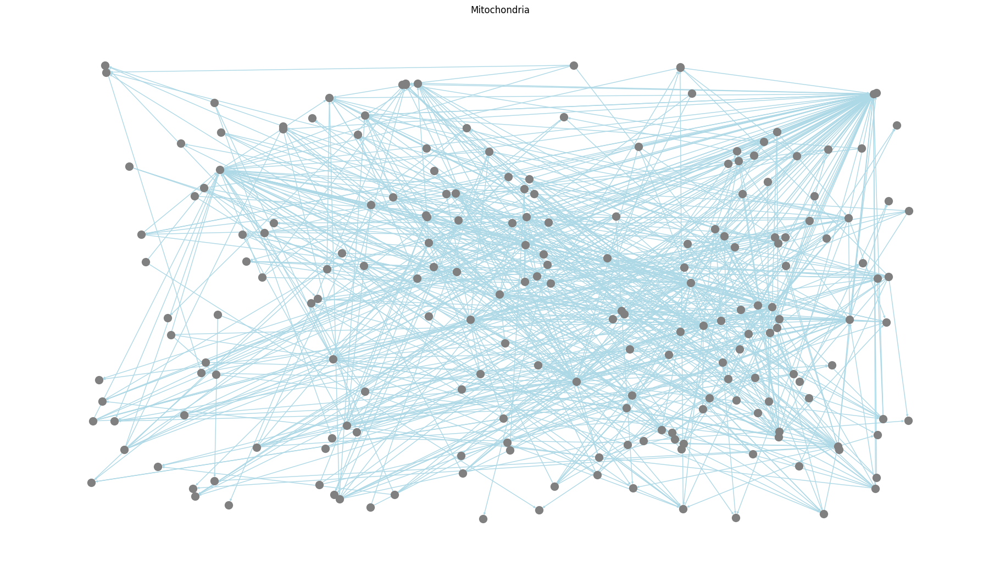

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import libsbml

# Load the SBML model
sbml_file = "model_bm_6.sbml"
document = libsbml.readSBML(sbml_file)
model = document.getModel()

# Create a directed graph
G = nx.DiGraph()

# Add metabolites (species) to the graph
for species in model.getListOfSpecies():
    compartment = species.getCompartment()
    if compartment == 'm':
        G.add_node(species.getId(), type='metabolite')

# Add reactions as edges
for reaction in model.getListOfReactions():
    for reactant in reaction.getListOfReactants():
        reactant_species = reactant.getSpecies()
        for product in reaction.getListOfProducts():
            product_species = product.getSpecies()
            if G.has_node(reactant_species) and G.has_node(product_species):
                G.add_edge(reactant_species, product_species)

# Set the positions of nodes for a hierarchical layout
pos = nx.random_layout(G)

# Draw the graph
plt.figure(figsize=(18, 10))
nx.draw(G, pos, with_labels=False, node_color='gray', node_size=100, edge_color='lightblue', arrowsize=5)

plt.title('Mitochondria')
plt.axis('off')
plt.show()

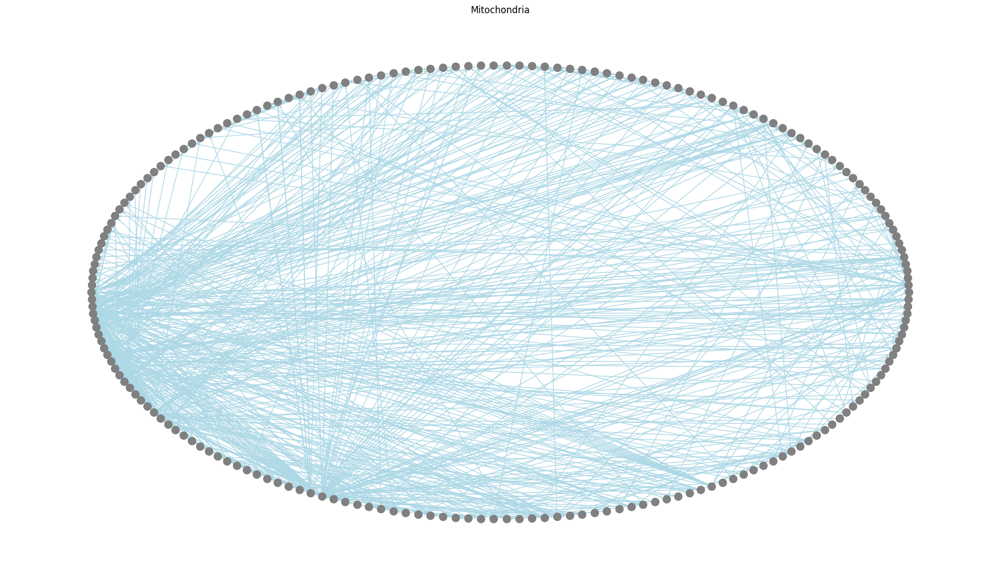

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import libsbml

# Load the SBML model
sbml_file = "model_bm_6.sbml"
document = libsbml.readSBML(sbml_file)
model = document.getModel()

# Create a directed graph
G = nx.DiGraph()

# Add metabolites (species) to the graph
for species in model.getListOfSpecies():
    compartment = species.getCompartment()
    if compartment == 'm':
        G.add_node(species.getId(), type='metabolite')

# Add reactions as edges
for reaction in model.getListOfReactions():
    for reactant in reaction.getListOfReactants():
        reactant_species = reactant.getSpecies()
        for product in reaction.getListOfProducts():
            product_species = product.getSpecies()
            if G.has_node(reactant_species) and G.has_node(product_species):
                G.add_edge(reactant_species, product_species)

# Set the positions of nodes for a hierarchical layout
pos = nx.shell_layout(G)

# Draw the graph
plt.figure(figsize=(18, 10))
nx.draw(G, pos, with_labels=False, node_color='gray', node_size=100, edge_color='lightblue', arrowsize=5)

plt.title('Mitochondria')
plt.axis('off')
plt.show()

# Flux balance analysis

In [ ]:
from cobra import Model, Metabolite, Reaction

In [ ]:
# Using Cobra Toolbox
import cobra
from cobra import Model, Metabolite, Reaction

# Making a toy model(matabolic network)
model=Model('toy model')
A = Metabolite('A', name='A', compartment='c')
B = Metabolite('B', name='B', compartment='c')
C = Metabolite('C', name='C', compartment='c')

# A -> B reaction
reaction=Reaction('ABC')
reaction.name='ABC'
reaction.lower_bound=10
reaction.upper_bound=100
reaction.add_metabolites({A:-1.0,B:1.0}) # A -> B
model.add_reactions([reaction])

# B -> C reaction
reaction=Reaction('BCA')
reaction.name='BCA'
reaction.lower_bound=5
reaction.upper_bound=100
reaction.add_metabolites({B:-2.0, C:1.0}) # 2B -> C
model.add_reactions([reaction])

# Setting the max objective function
model.objective='BCA'

solution=model.optimize()
solution.objective_value
solution.fluxes
#print(solution.objective_value)
print(solution.fluxes)

ABC    10.0
BCA     5.0
Name: fluxes, dtype: float64


/usr/local/lib/python3.10/dist-packages/cobra/util/solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


In [ ]:
model=Model('toy model')

A = Metabolite('A', name='A', compartment='c')
B = Metabolite('B', name='B', compartment='c')
C = Metabolite('C', name='C', compartment='c')
D = Metabolite('D', name='D', compartment='c')
E = Metabolite('E', name='E', compartment='c')
F = Metabolite('F', name='F', compartment='c')
G = Metabolite('G', name='G', compartment='c')
H = Metabolite('H', name='H', compartment='c')

NAD = Metabolite('NAD', name='NAD', compartment='c')
NADH = Metabolite('NADH', name='NADH', compartment='c')
ADP = Metabolite('ADP', name='ADP', compartment='c')
ATP = Metabolite('ATP', name='ATP', compartment='c')
CO2 = Metabolite('CO2', name='CO2', compartment='c')



reaction=Reaction('A_Tr')
reaction.name='A_Tr'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({A:1.0})
model.add_reactions([reaction])

reaction=Reaction('B_Tr')
reaction.name='B_Tr'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({B:1.0})
model.add_reactions([reaction])

reaction=Reaction('E_Tr')
reaction.name='E_Tr'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({E:-1.0})
model.add_reactions([reaction])

reaction=Reaction('G_Tr')
reaction.name='G_Tr'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({G:-1.0})
model.add_reactions([reaction])

reaction=Reaction('H_Tr')
reaction.name='H_Tr'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({H:-1.0})
model.add_reactions([reaction])

reaction=Reaction('CO2_Tr')
reaction.name='CO2_Tr'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({CO2:-1.0})
model.add_reactions([reaction])

# A + ATP -> C + CO2 + ADP
reaction=Reaction('v_1')
reaction.name='v_1'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({A:-1.0, ATP:-1.0, C:1.0, CO2:1.0, ADP:1.0})
model.add_reactions([reaction])

# B + NAD -> C + NADH
reaction=Reaction('v_2')
reaction.name='v_2'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({B:-1.0, NAD:-1.0, C:1.0, NADH:1.0})
model.add_reactions([reaction])

# C + ADP -> D + ATP
reaction=Reaction('v_3')
reaction.name='v_3'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({C:-1.0, ADP:-1.0, D:1.0, ATP:1.0})
model.add_reactions([reaction])

# C -> E + CO2
reaction=Reaction('v_4')
reaction.name='v_4'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({C:-1.0, E:1.0,CO2:1.0})
model.add_reactions([reaction])

# D + ATP -> F + CO2 + ATP
reaction=Reaction('v_5')
reaction.name='v_5'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({D:-1.0, ATP:-1.0, F:1.0, CO2:1.0, ATP:1.0})
model.add_reactions([reaction])

# D + NADH -> G + NAD
reaction=Reaction('v_6')
reaction.name='v_6'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({D:-1.0, NADH:-1.0, G:1.0, NAD:1.0})
model.add_reactions([reaction])

# F + NADH + ATP -> H + NAD + ADP
reaction=Reaction('v_7')
reaction.name='v_7'
reaction.lower_bound=0.
reaction.upper_bound=1000.
reaction.add_metabolites({F:-1.0, NADH:-1.0, ATP:-1.0, H:1.0, NAD:1.0, ADP:1.0})
model.add_reactions([reaction])

model.objective='v_6'
solution=model.optimize()
solution.fluxes

A_Tr       500.0
B_Tr       500.0
E_Tr       500.0
G_Tr       500.0
H_Tr         0.0
CO2_Tr    1000.0
v_1        500.0
v_2        500.0
v_3        500.0
v_4        500.0
v_5          0.0
v_6        500.0
v_7          0.0
Name: fluxes, dtype: float64

# Construct Model

Usually, COBRApy use .sbml file but this article has model data only with excel files (except for open model), so we used importexcel.py code.

In [3]:
import pandas as pd
from cobra import Model, Reaction, Metabolite

MET_SHEET_ID='Metabolite List'
MET_ID_IDX='Abbreviation'
MET_FORMULA_IDX='Charged formula'
MET_NAME_IDX='Description'
MET_COMPARTMENT_IDX='Compartment'
MET_CHARGE_IDX='Charge'
DEFAULT_COMPARTMENT='c'
RXN_SHEET_ID='Reaction List'
RXN_ID_IDX='Abbreviation'
RXN_REACTION_IDX='Reaction'
RXN_NAME_IDX='Description'
RXN_GPR_IDX='GPR'
RXN_SUBSYSTEM_IDX='Subsystem'
RXN_LOWER_BOUND_IDX='Lower bound'
RXN_UPPER_BOUND_IDX='Upper bound'
RXN_OBJECTIVE_IDX='Objective'
DEFAULT_LOWER_BOUND=0
DEFAULT_UPPER_BOUND=1000
DEFAULT_OBJECTIVE_COEFF=0

def import_excel_model(file_excel_path, model_id="default_model"):
    # Create a new cobra model
    model = Model(model_id)

    #Import metabolites
    model_excel_metabolites=pd.read_excel(file_excel_path,sheet_name=MET_SHEET_ID)
    metabolites_list=list()
    for index,row in model_excel_metabolites.iterrows():
        compartment=row[MET_COMPARTMENT_IDX] if not pd.isna(row[MET_COMPARTMENT_IDX]) else DEFAULT_COMPARTMENT
        metabolite=Metabolite(id=row[MET_ID_IDX],
                  formula=row[MET_FORMULA_IDX],
                  name=row[MET_NAME_IDX],
                  compartment=compartment,
                  charge=row[MET_CHARGE_IDX])
        metabolites_list.append(metabolite)
    # Add metabolites to the model
    model.add_metabolites(metabolites_list)

    #Import reactions
    model_excel_reactions=pd.read_excel(file_excel_path,sheet_name=RXN_SHEET_ID)

    for index,row in model_excel_reactions.iterrows():
        if not pd.isna(row[RXN_ID_IDX]):
            lb=row[RXN_LOWER_BOUND_IDX] if not pd.isna(row[RXN_LOWER_BOUND_IDX]) else DEFAULT_LOWER_BOUND
            ub=row[RXN_UPPER_BOUND_IDX] if not pd.isna(row[RXN_UPPER_BOUND_IDX]) else DEFAULT_UPPER_BOUND
            objective_coeff=row[RXN_OBJECTIVE_IDX] if not pd.isna(row[RXN_OBJECTIVE_IDX]) else DEFAULT_OBJECTIVE_COEFF

            reaction=Reaction(id=row[RXN_ID_IDX],
                                 name=row[RXN_NAME_IDX],
                                 subsystem=row[RXN_SUBSYSTEM_IDX]
                                 )

            # Add Genes
            if not pd.isna(row[RXN_GPR_IDX]):
                reaction.gene_reaction_rule=row[RXN_GPR_IDX]
            # Add the reaction to the model
            model.add_reactions([reaction])
            # Add the reaction formula
            try:
                model.reactions.get_by_id(row[RXN_ID_IDX]).build_reaction_from_string(row[RXN_REACTION_IDX])
            except Exception as e:
                print("Error parsing %s string '%s'" % (repr(rxn), rxn_str))
                raise e

            # Include the objective coefficient and bounds
            model.reactions.get_by_id(row[RXN_ID_IDX]).objective_coefficient=objective_coeff
            model.reactions.get_by_id(row[RXN_ID_IDX]).lower_bound=lb
            model.reactions.get_by_id(row[RXN_ID_IDX]).upper_bound=ub
        else:
            print("The row: "+index+" is empty or doesn't have id.")

    return(model)


In [4]:
# 10(open~M120) life stage excel load
import cobra
bm_6_open = cobra.io.read_sbml_model('/content/drive/MyDrive/Systems Biology/model_bm_6.sbml')
bm_6_open_xl = import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6.xlsx')
bm_6_L3=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_L3.xlsx', model_id="model_bm_6_L3")
bm_6_L3D6=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_L3D6.xlsx', model_id="model_bm_6_L3D6")
bm_6_L3D9=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_L3D9.xlsx', model_id="model_bm_6_L3D9")
bm_6_L4=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_L4.xlsx', model_id="model_bm_6_L4")
bm_6_M30=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_M30.xlsx', model_id="model_bm_6_M30")
bm_6_F30=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_F30.xlsx', model_id="model_bm_6_F30")
bm_6_M42=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_M42.xlsx', model_id="model_bm_6_M42")
bm_6_F42=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_F42.xlsx', model_id="model_bm_6_F42")
bm_6_M120=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_M120.xlsx', model_id="model_bm_6_M120")
bm_6_F120=import_excel_model('/content/drive/MyDrive/Systems Biology/model_bm_6_F120.xlsx', model_id="model_bm_6_F120")

# Explore models

In [ ]:
bm_6_open

Name,model_bm_6
Memory address,7f0f8429acb0
Number of metabolites,1252
Number of reactions,1266
Number of genes,0
Number of groups,0
Objective expression,1.0*BIOMASS_SCALED - 1.0*BIOMASS_SCALED_reverse_83387
Compartments,", c, m, w"


In [ ]:
for reaction in bm_6_open.reactions:
    print(reaction.id)

In [ ]:
bm_6_open.metabolites.C00020.summary()

Percent,Flux,Reaction,Definition
27.10%,14.76,R00185,C00002 + C00212 --> C00008 + C00020 + C00080
1.49%,0.8101,R00189,C00002 + C00014 + C00857 --> C00003 + C00013 + C00020
0.72%,0.3905,R00390_1,C00002 + C00010 + C01595 <=> C00013 + C00020 + C02050
18.81%,10.24,R01049,C00002 + C00117 <=> C00020 + C00080 + C00119
4.24%,2.31,R01230,C00002 + C00014 + C00655 --> C00013 + C00020 + C00080 + C00144
21.78%,11.86,R01280,C00002 + C00010 + C00249 --> C00013 + C00020 + C00154
0.74%,0.405,R04230,C00002 + C00097 + C03492 --> C00013 + C00020 + C00080 + C04352
25.11%,13.67,RCC0056,C00002 + C00010 + C06424 <=> C00013 + C00020 + C02593
Percent,Flux,Reaction,Definition
95.76%,-52.14,R00127,C00002 + C00020 <=> 2.0 C00008


In [ ]:
solution=bm_6_open.optimize()

In [ ]:
solution

,fluxes,reduced_costs
ACYLCOA_1,24.600263,0.000000e+00
ACYLCOA_2,0.000000,-1.041258e-02
ACYLCOA_3,0.000000,-2.082516e-02
ACYLCOA_4,0.000000,-3.123774e-02
ACYLCOA_5,0.000000,-4.165032e-02
...,...,...
W_TRANS_6,9.116159,6.245005e-17
W_TRANS_7,1.000286,-1.318390e-16
W_TRANS_8,1.253879,-1.457168e-16
W_TRANS_9,1.197525,-8.326673e-17


# Figure 2
## optimization of fluxes

In [5]:
import numpy as np
import matplotlib.pyplot as plt

def figure2(glucose, oxygen, model_id):
    model=model_id
    condition = []
    wolbachia_weights = np.arange(0,1,0.01)


    # Set lower bound, upper bound of glucose, oxygen, biomass for wolbachia_weights and 4 nutritional conditions
    for weight in wolbachia_weights:
        wolbachia_coefficient = weight

        # Glucose reaction
        glucose_reaction = model.reactions.get_by_id("CARBON_SOURCE")
        glucose_reaction.upper_bound, glucose_reaction.lower_bound = 1000,0
        glucose_reaction.upper_bound, glucose_reaction.lower_bound = glucose, glucose

        # Oxygen reaction
        oxygen_reaction = model.reactions.get_by_id("DIFFUSION_2")
        oxygen_reaction.upper_bound, oxygen_reaction.lower_bound = 1000,0
        oxygen_reaction.upper_bound, oxygen_reaction.lower_bound = oxygen, oxygen

        # Biomass reaction
        biomass_reaction = model.reactions.get_by_id("BIOMASS_SCALED")
        biomass_reaction.lower_bound = 0
        biomass_reaction.upper_bound = 1000
        biomass_reaction.add_metabolites({model.metabolites.get_by_id("Bio_unscaled_w"): wolbachia_coefficient})

        # Optimize
        solution = model.optimize()
        #print(biomass_reaction.reaction, solution.objective_value)
        condition.append(solution.objective_value)

        # Remove the metabolite with the modified coefficient after each iteration
        biomass_reaction.subtract_metabolites({model.metabolites.get_by_id("Bio_unscaled_w"): wolbachia_coefficient})

    return condition



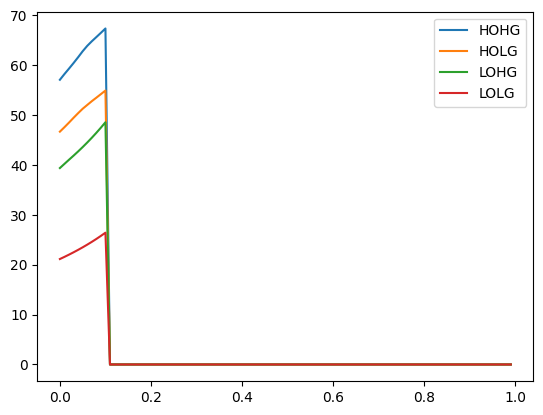

In [ ]:
import warnings
warnings.filterwarnings( 'ignore' )
HOHG = figure2(glucose=250, oxygen=580, model_id=bm_6_open)
HOLG = figure2(glucose=45, oxygen=580, model_id=bm_6_open)
LOHG = figure2(glucose=250, oxygen=90, model_id=bm_6_open)
LOLG = figure2(glucose=45, oxygen=90, model_id=bm_6_open)

wolbachia_weights = np.arange(0,1,0.01)
plt.plot(wolbachia_weights, HOHG, label='HOHG')
plt.plot(wolbachia_weights, HOLG, label='HOLG')
plt.plot(wolbachia_weights, LOHG, label='LOHG')
plt.plot(wolbachia_weights, LOLG, label='LOLG')
plt.legend()

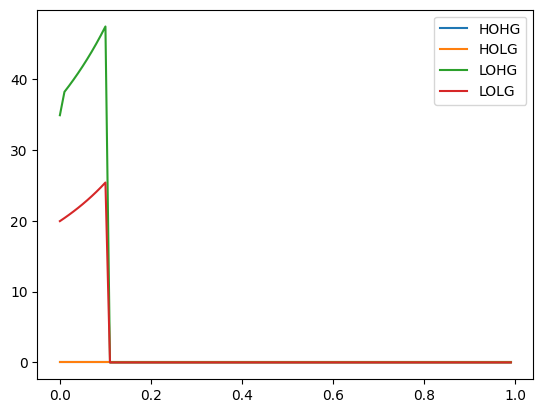

In [ ]:
HOHG = figure2(glucose=250, oxygen=580, model_id=bm_6_L3)
HOLG = figure2(glucose=45, oxygen=580, model_id=bm_6_L3)
LOHG = figure2(glucose=250, oxygen=90, model_id=bm_6_L3)
LOLG = figure2(glucose=45, oxygen=90, model_id=bm_6_L3)

wolbachia_weights = np.arange(0,1,0.01)
plt.plot(wolbachia_weights, HOHG, label='HOHG')
plt.plot(wolbachia_weights, HOLG, label='HOLG')
plt.plot(wolbachia_weights, LOHG, label='LOHG')
plt.plot(wolbachia_weights, LOLG, label='LOLG')
plt.legend()

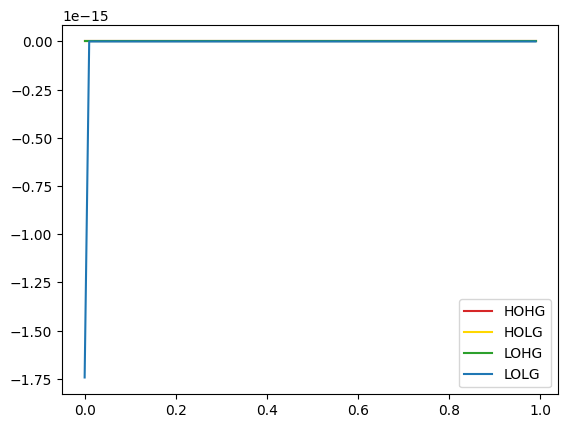

In [ ]:
import warnings
warnings.filterwarnings( 'ignore' )
HOHG = figure2(glucose=250, oxygen=580, model_id=bm_6_L3D6)
HOLG = figure2(glucose=45, oxygen=580, model_id=bm_6_L3D6)
LOHG = figure2(glucose=250, oxygen=90, model_id=bm_6_L3D6)
LOLG = figure2(glucose=45, oxygen=90, model_id=bm_6_L3D6)

wolbachia_weights = np.arange(0,1,0.01)
plt.plot(wolbachia_weights, HOHG, 'tab:red',  label='HOHG')
plt.plot(wolbachia_weights, HOLG, 'gold', label='HOLG')
plt.plot(wolbachia_weights, LOHG, 'tab:green', label='LOHG')
plt.plot(wolbachia_weights, LOLG, 'tab:blue', label='LOLG')
plt.legend()

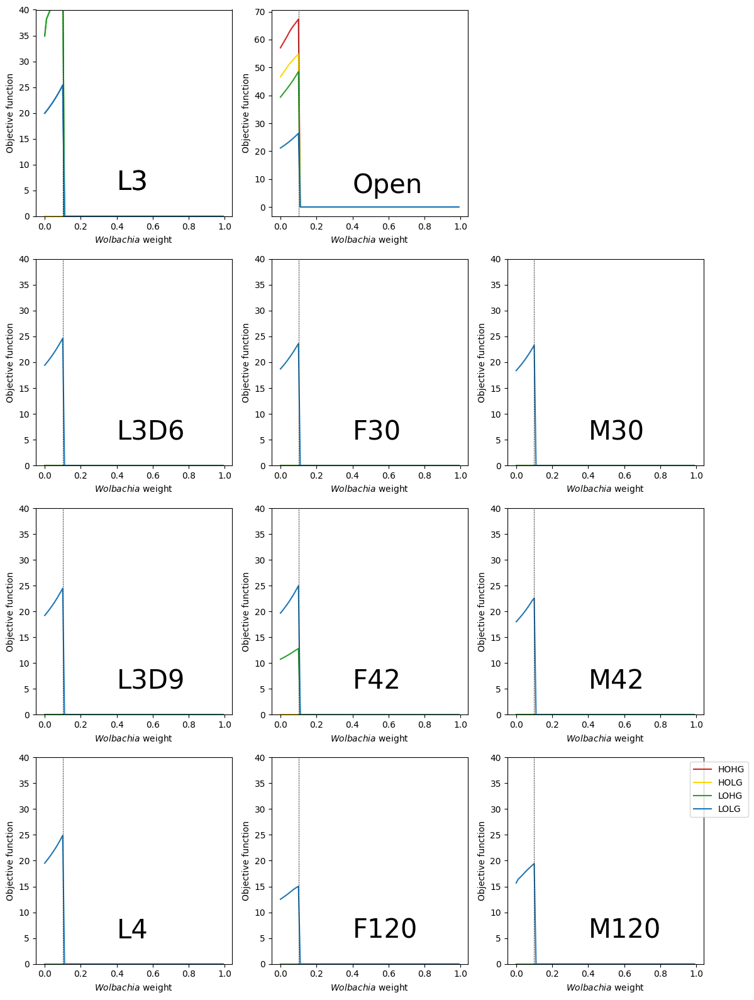

In [6]:
import warnings
warnings.filterwarnings( 'ignore' )

import matplotlib.pyplot as plt
import matplotlib.pyplot as gridspec

# Make a list of the files read above and import them
model_list = [bm_6_L3, bm_6_open, bm_6_L3D6, bm_6_F30, bm_6_M30,  bm_6_L3D9,bm_6_F42,bm_6_M42, bm_6_L4, bm_6_F120, bm_6_M120]
model_stage = ["L3", "Open", "L3D6",  "F30", "M30", "L3D9","F42", "M42",  "L4",  "F120","M120"]

fig, axes = plt.subplots(4,3,figsize=(12,16))

#Set the values of glucose and oxygen by giving 4 different constraints
HOHG = figure2(glucose=250, oxygen=580, model_id=bm_6_L3)
HOLG = figure2(glucose=45, oxygen=580, model_id=bm_6_L3)
LOHG = figure2(glucose=250, oxygen=90, model_id=bm_6_L3)
LOLG = figure2(glucose=45, oxygen=90, model_id=bm_6_L3)

# Read 10 life stage models and create a plot
for i, model in enumerate(model_list):
    HOHG = figure2(glucose=250, oxygen=580, model_id=model)
    HOLG = figure2(glucose=45, oxygen=580, model_id=model)
    LOHG = figure2(glucose=250, oxygen=90, model_id=model)
    LOLG = figure2(glucose=45, oxygen=90, model_id=model)

    # Create a subplot. row and column settings
    if i<2:
        row = 0
        col = i
    else:
        row = (i + 1) // 3
        col = (i + 1) % 3

    # The result of L3 did not come out well, so I tried subtracting it separately
    if i==0:
        wolbachia_weights = np.arange(0,1,0.01)
        axes[0, 0].plot(wolbachia_weights, HOHG, 'tab:red',  label='HOHG')
        axes[0, 0].plot(wolbachia_weights, HOLG, 'gold', label='HOLG')
        axes[0, 0].plot(wolbachia_weights, LOHG, 'tab:green', label='LOHG')
        axes[0, 0].plot(wolbachia_weights, LOLG, 'tab:blue', label='LOLG')
        axes[0, 0].set_xlabel("$\mathit{Wolbachia}$ weight")
        axes[0, 0].set_ylabel("Objective function")
        axes[0, 0].axvline(x=0.1, color='k', linestyle='dashed', linewidth = "0.5")
        axes[0, 0].text(0.4, 5, model_stage[0], fontsize = 30)

    ax = axes[row, col]


    wolbachia_weights = np.arange(0,1,0.01)
    ax.plot(wolbachia_weights, HOHG, 'tab:red',  label='HOHG')
    ax.plot(wolbachia_weights, HOLG, 'gold', label='HOLG')
    ax.plot(wolbachia_weights, LOHG, 'tab:green', label='LOHG')
    ax.plot(wolbachia_weights, LOLG, 'tab:blue', label='LOLG')
    ax.set_xlabel("$\mathit{Wolbachia}$ weight")
    ax.set_ylabel("Objective function")
    ax.axvline(x=0.1, color='k', linestyle='dashed', linewidth = "0.5")
    ax.text(0.4, 5, model_stage[i], fontsize = 30)

    # Set graph size in detail (open model ylim is (0,70))
    if model!=bm_6_open:
        ax.set_ylim(0,40)

axes[0,2].remove()
plt.legend(labels=['HOHG', 'HOLG', 'LOHG', 'LOLG'], bbox_to_anchor=(1.25, 1), loc='upper right', ncol=1)
plt.tight_layout()
plt.show()

# Figure 3
## Heatmap

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def heatmap(model):

    # Define the range of oxygen and glucose availabilities
    oxygen_range = np.linspace(1, 701, num=25)
    glucose_range = np.linspace(1, 251, num=25)

    # Perform pFBA for all combinations of oxygen and glucose
    objective_values = np.zeros((25, 25))
    reaction_values = np.zeros((25, 25, 6))  # Array to store activity of 6 reactions

    for i, oxygen in enumerate(oxygen_range):
        for j, glucose in enumerate(glucose_range):
            model.reactions.get_by_id("DIFFUSION_2").bounds = (oxygen, oxygen)
            model.reactions.get_by_id("CARBON_SOURCE").bounds = (glucose, glucose)
            solution = model.optimize()
            objective_values[i, j] = solution.objective_value
            reaction_values[i, j, 0] = solution.fluxes["R01082_M"]
            reaction_values[i, j, 1] = solution.fluxes["R00253"]
            reaction_values[i, j, 2] = solution.fluxes["SINK_3"]
            reaction_values[i, j, 3] = solution.fluxes["SINK_2"]
            reaction_values[i, j, 4] = solution.fluxes["SINK_4"]


    # Create the figure and subplots for the heatmaps
    fig, axs = plt.subplots(1, 6, figsize=(18, 2))
    reaction_names = ["Fumarase", "Glyoxylate pathway", "Acetate waste", "succinate waste", "Propanoate waste"]

    # Plot the objective function activity heatmap
    sns.heatmap(np.flipud(objective_values.T), annot=False, fmt=".2f", cbar=True, ax=axs[0], center=0, cmap=sns.diverging_palette(10, 240, as_cmap=True))
    axs[0].set_title("Objective Function")
    axs[0].set_xlabel("Oxygen")
    axs[0].set_ylabel("Glucose")
    axs[0].axvline(x=5, color='k', linestyle='dashed')

    # Plot the heatmaps for the activity of the 6 reactions
    for i, ax in enumerate(axs.flat[1:]):
        sns.heatmap(np.flipud(reaction_values[:, :, i].T), annot=False, fmt=".2f", center=0, cmap=sns.diverging_palette(10,240, as_cmap=True),  cbar=True, ax=ax)
        ax.set_title(reaction_names[i])
        ax.set_xlabel("Oxygen")
        ax.set_ylabel("Glucose")
        ax.axvline(x=5, color='k', linestyle='dashed')

    # Set the color bar label
    cbar = axs[0].collections[0].colorbar

    plt.show()


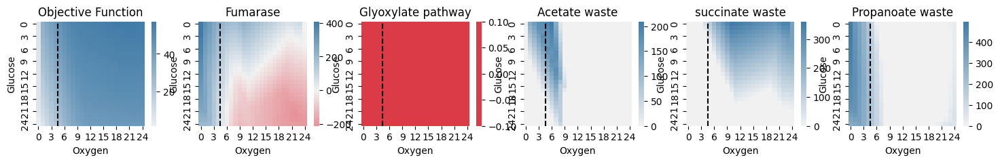

In [ ]:
heatmap(bm_6_open_xl)

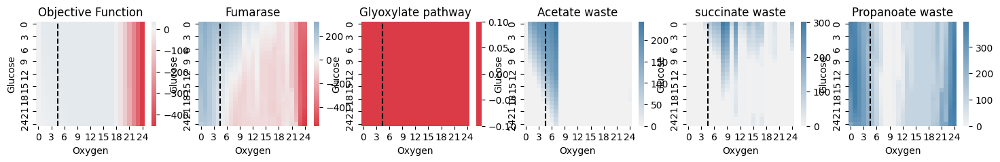

In [ ]:
heatmap(bm_6_L3)

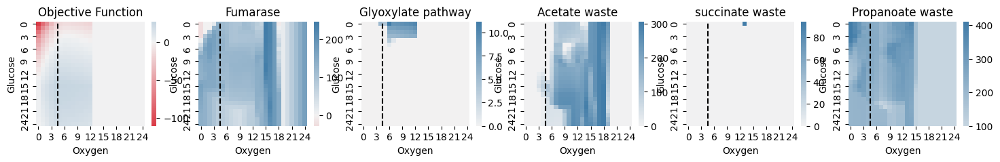

In [ ]:
heatmap(bm_6_L3D6)

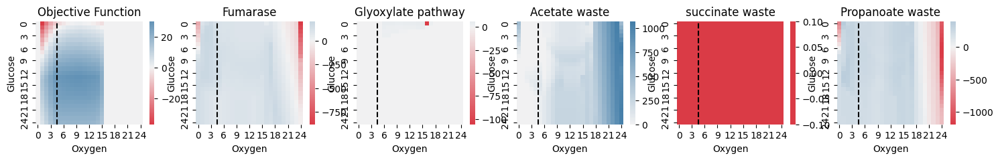

In [ ]:
heatmap(bm_6_L3D9)

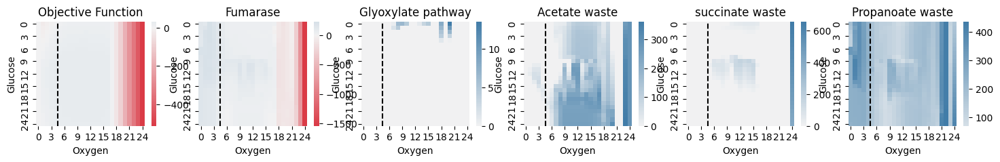

In [ ]:
heatmap(bm_6_L4)

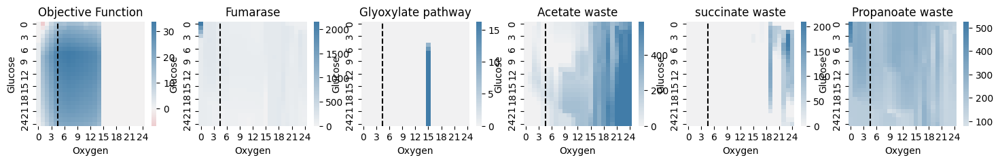

In [ ]:
heatmap(bm_6_F30)

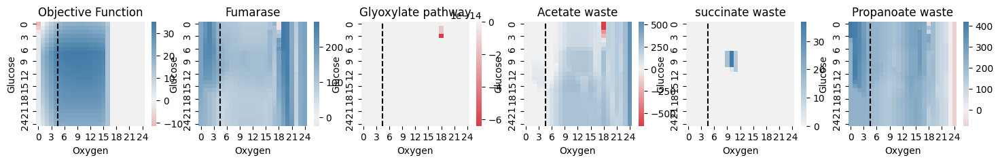

In [ ]:
heatmap(bm_6_F42)

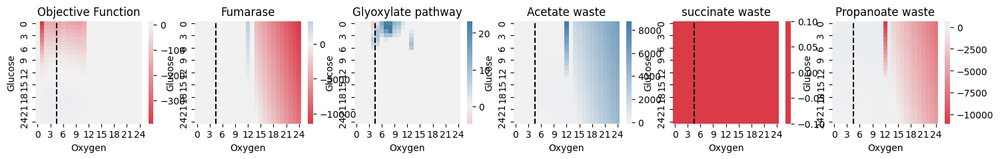

In [ ]:
heatmap(bm_6_F120)

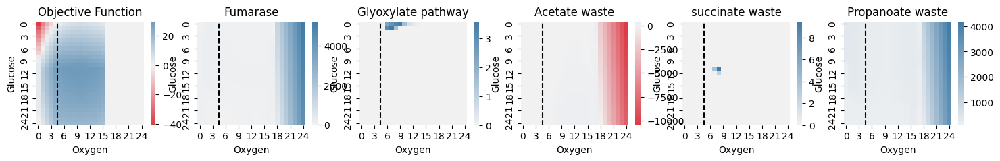

In [ ]:
heatmap(bm_6_M30)

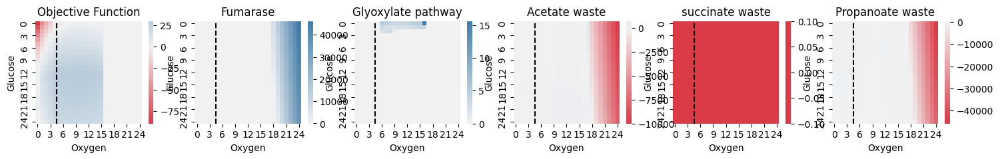

In [ ]:
heatmap(bm_6_M42)

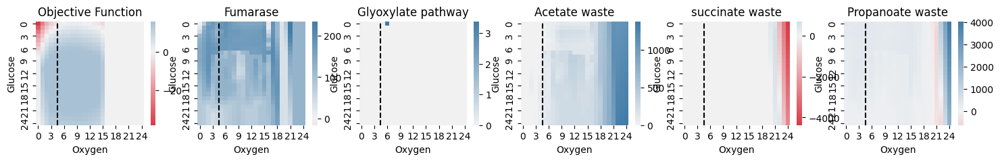

In [ ]:
heatmap(bm_6_M120)

# Figure 5

## HOHG

In [ ]:
import numpy as np
import cobra

wolbachia_weights = np.arange(0, 1, 0.01)

HOHG_Open = []
HOHG_L3 = []
HOHG_L3D6 = []
HOHG_L3D9 = []
HOHG_L4 = []
HOHG_M30 = []
HOHG_F30 = []
HOHG_M42 = []
HOHG_F42 = []
HOHG_M120 = []
HOHG_F120 = []


for weight in wolbachia_weights:
    wolbachia_coefficient = weight

    glucose_reaction = bm_6_open.reactions.get_by_id("CARBON_SOURCE")
    glucose_reaction.lower_bound = 0
    glucose_reaction.upper_bound = 250

    oxygen_reaction = bm_6_open.reactions.get_by_id("DIFFUSION_2")
    oxygen_reaction.lower_bound = 0
    oxygen_reaction.upper_bound = 580

    biomass_reaction = bm_6_open.reactions.get_by_id("BIOMASS_SCALED")
    biomass_reaction.lower_bound = 0
    biomass_reaction.upper_bound = 1000

    open_solution = bm_6_open.optimize()
    open_objective_value = round(open_solution.objective_value, 1)

    L3_solution = bm_6_L3.optimize()
    L3_objective_value = round(L3_solution.objective_value, 1)

    L3D6_solution = bm_6_L3D6.optimize()
    L3D6_objective_value = round(L3D6_solution.objective_value, 1)

    L3D9_solution = bm_6_L3D9.optimize()
    L3D9_objective_value = round(L3D9_solution.objective_value, 1)

    L4_solution = bm_6_L4.optimize()
    L4_objective_value = round(L4_solution.objective_value, 1)

    M30_solution = bm_6_M30.optimize()
    M30_objective_value = round(M30_solution.objective_value, 1)

    F30_solution = bm_6_F30.optimize()
    F30_objective_value = round(F30_solution.objective_value, 1)

    M42_solution = bm_6_M42.optimize()
    M42_objective_value = round(M42_solution.objective_value, 1)

    F42_solution = bm_6_F42.optimize()
    F42_objective_value = round(F42_solution.objective_value, 1)

    M120_solution = bm_6_M120.optimize()
    M120_objective_value = round(M120_solution.objective_value, 1)

    F120_solution = bm_6_F120.optimize()
    F120_objective_value = round(F120_solution.objective_value, 1)

HOHG_Open.append(open_objective_value)
HOHG_L3.append(L3_objective_value)
HOHG_L3D6.append(L3D6_objective_value)
HOHG_L3D9.append(L3D9_objective_value)
HOHG_L4.append(L4_objective_value)
HOHG_M30.append(M30_objective_value)
HOHG_F30.append(F30_objective_value)
HOHG_M42.append(M42_objective_value)
HOHG_F42.append(F42_objective_value)
HOHG_M120.append(M120_objective_value)
HOHG_F120.append(F120_objective_value)

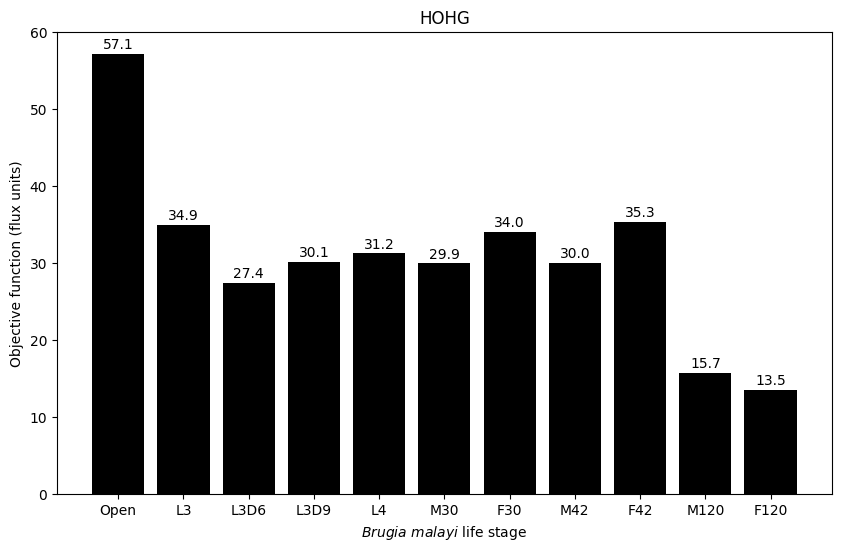

In [ ]:
import matplotlib.pyplot as plt

x_labels = ['Open', 'L3', 'L3D6', 'L3D9', 'L4', 'M30', 'F30', 'M42', 'F42', 'M120', 'F120']
y_values = [HOHG_Open[0], HOHG_L3[0], HOHG_L3D6[0], HOHG_L3D9[0], HOHG_L4[0], HOHG_M30[0], HOHG_F30[0], HOHG_M42[0], HOHG_F42[0], HOHG_M120[0], HOHG_F120[0]]

x = range(len(x_labels))
width = 0.8

plt.figure(figsize=(10, 6))
bars = plt.bar(x, y_values, width, color='black')

plt.xlabel(r'$\mathit{Brugia\ malayi}$ life stage')
plt.ylabel('Objective function (flux units)')
plt.title('HOHG')
plt.xticks(x, x_labels)
plt.yticks(range(0, 61, 10))

for bar, y_value in zip(bars, y_values):
    plt.text((bar.get_x() + bar.get_width() / 2), (y_value + 0.3), (y_value), ha='center', va='bottom', color='black')

plt.show()

## HOLG

In [ ]:
import numpy as np
import cobra

wolbachia_weights = np.arange(0, 1, 0.01)

HOLG_Open = []
HOLG_L3 = []
HOLG_L3D6 = []
HOLG_L3D9 = []
HOLG_L4 = []
HOLG_M30 = []
HOLG_F30 = []
HOLG_M42 = []
HOLG_F42 = []
HOLG_M120 = []
HOLG_F120 = []

for weight in wolbachia_weights:
    wolbachia_coefficient = weight

    glucose_reaction = bm_6_open.reactions.get_by_id("CARBON_SOURCE")
    glucose_reaction.lower_bound = 0
    glucose_reaction.upper_bound = 45

    oxygen_reaction = bm_6_open.reactions.get_by_id("DIFFUSION_2")
    oxygen_reaction.lower_bound = 0
    oxygen_reaction.upper_bound = 580

    biomass_reaction = bm_6_open.reactions.get_by_id("BIOMASS_SCALED")
    biomass_reaction.lower_bound = 0
    biomass_reaction.upper_bound = 1000

    open_solution = bm_6_open.optimize()
    open_objective_value = round(open_solution.objective_value, 1)

    L3_solution = bm_6_L3.optimize()
    L3_objective_value = round(L3_solution.objective_value, 1)

    L3D6_solution = bm_6_L3D6.optimize()
    L3D6_objective_value = round(L3D6_solution.objective_value, 1)

    L3D9_solution = bm_6_L3D9.optimize()
    L3D9_objective_value = round(L3D9_solution.objective_value, 1)

    L4_solution = bm_6_L4.optimize()
    L4_objective_value = round(L4_solution.objective_value, 1)

    M30_solution = bm_6_M30.optimize()
    M30_objective_value = round(M30_solution.objective_value, 1)

    F30_solution = bm_6_F30.optimize()
    F30_objective_value = round(F30_solution.objective_value, 1)

    M42_solution = bm_6_M42.optimize()
    M42_objective_value = round(M42_solution.objective_value, 1)

    F42_solution = bm_6_F42.optimize()
    F42_objective_value = round(F42_solution.objective_value, 1)

    M120_solution = bm_6_M120.optimize()
    M120_objective_value = round(M120_solution.objective_value, 1)

    F120_solution = bm_6_F120.optimize()
    F120_objective_value = round(F120_solution.objective_value, 1)

HOLG_Open.append(open_objective_value)
HOLG_L3.append(L3_objective_value)
HOLG_L3D6.append(L3D6_objective_value)
HOLG_L3D9.append(L3D9_objective_value)
HOLG_L4.append(L4_objective_value)
HOLG_M30.append(M30_objective_value)
HOLG_F30.append(F30_objective_value)
HOLG_M42.append(M42_objective_value)
HOLG_F42.append(F42_objective_value)
HOLG_M120.append(M120_objective_value)
HOLG_F120.append(F120_objective_value)

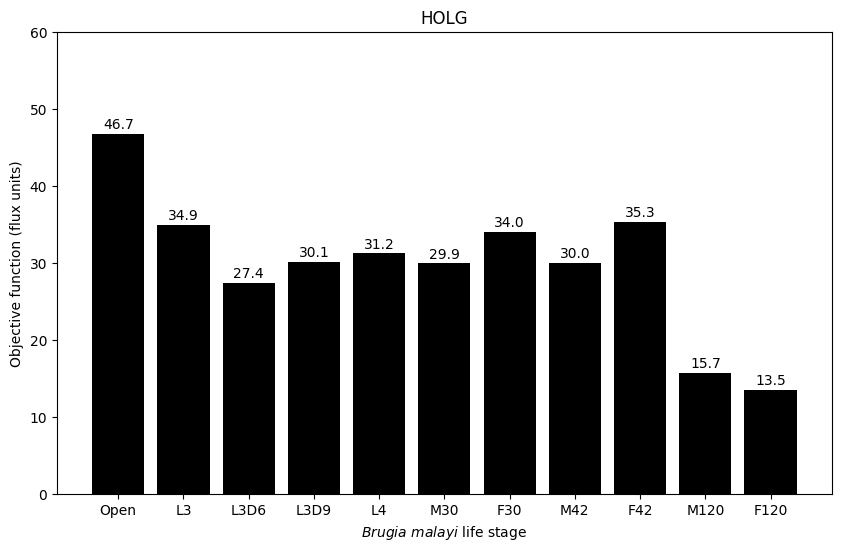

In [ ]:
import matplotlib.pyplot as plt

x_labels = ['Open', 'L3', 'L3D6', 'L3D9', 'L4', 'M30', 'F30', 'M42', 'F42', 'M120', 'F120']
y_values = [HOLG_Open[0], HOLG_L3[0], HOLG_L3D6[0], HOLG_L3D9[0], HOLG_L4[0], HOLG_M30[0], HOLG_F30[0], HOLG_M42[0], HOLG_F42[0], HOLG_M120[0], HOLG_F120[0]]

x = range(len(x_labels))
width = 0.8

plt.figure(figsize=(10, 6))
bars = plt.bar(x, y_values, width, color='black')

plt.xlabel(r'$\mathit{Brugia\ malayi}$ life stage')
plt.ylabel('Objective function (flux units)')
plt.title('HOLG')
plt.xticks(x, x_labels)
plt.yticks(range(0, 61, 10))

for bar, y_value in zip(bars, y_values):
    plt.text((bar.get_x() + bar.get_width() / 2), (y_value + 0.3), (y_value), ha='center', va='bottom', color='black')

plt.show()

## LOHG

In [ ]:
import numpy as np
import cobra

wolbachia_weights = np.arange(0, 1, 0.01)

LOHG_Open = []
LOHG_L3 = []
LOHG_L3D6 = []
LOHG_L3D9 = []
LOHG_L4 = []
LOHG_M30 = []
LOHG_F30 = []
LOHG_M42 = []
LOHG_F42 = []
LOHG_M120 = []
LOHG_F120 = []

for weight in wolbachia_weights:
    wolbachia_coefficient = weight

    glucose_reaction = bm_6_open.reactions.get_by_id("CARBON_SOURCE")
    glucose_reaction.lower_bound = 0
    glucose_reaction.upper_bound = 250

    oxygen_reaction = bm_6_open.reactions.get_by_id("DIFFUSION_2")
    oxygen_reaction.lower_bound = 0
    oxygen_reaction.upper_bound = 90

    biomass_reaction = bm_6_open.reactions.get_by_id("BIOMASS_SCALED")
    biomass_reaction.lower_bound = 0
    biomass_reaction.upper_bound = 1000

    open_solution = bm_6_open.optimize()
    open_objective_value = round(open_solution.objective_value, 1)

    L3_solution = bm_6_L3.optimize()
    L3_objective_value = round(L3_solution.objective_value, 1)

    L3D6_solution = bm_6_L3D6.optimize()
    L3D6_objective_value = round(L3D6_solution.objective_value, 1)

    L3D9_solution = bm_6_L3D9.optimize()
    L3D9_objective_value = round(L3D9_solution.objective_value, 1)

    L4_solution = bm_6_L4.optimize()
    L4_objective_value = round(L4_solution.objective_value, 1)

    M30_solution = bm_6_M30.optimize()
    M30_objective_value = round(M30_solution.objective_value, 1)

    F30_solution = bm_6_F30.optimize()
    F30_objective_value = round(F30_solution.objective_value, 1)

    M42_solution = bm_6_M42.optimize()
    M42_objective_value = round(M42_solution.objective_value, 1)

    F42_solution = bm_6_F42.optimize()
    F42_objective_value = round(F42_solution.objective_value, 1)

    M120_solution = bm_6_M120.optimize()
    M120_objective_value = round(M120_solution.objective_value, 1)

    F120_solution = bm_6_F120.optimize()
    F120_objective_value = round(F120_solution.objective_value, 1)

LOHG_Open.append(open_objective_value)
LOHG_L3.append(L3_objective_value)
LOHG_L3D6.append(L3D6_objective_value)
LOHG_L3D9.append(L3D9_objective_value)
LOHG_L4.append(L4_objective_value)
LOHG_M30.append(M30_objective_value)
LOHG_F30.append(F30_objective_value)
LOHG_M42.append(M42_objective_value)
LOHG_F42.append(F42_objective_value)
LOHG_M120.append(M120_objective_value)
LOHG_F120.append(F120_objective_value)

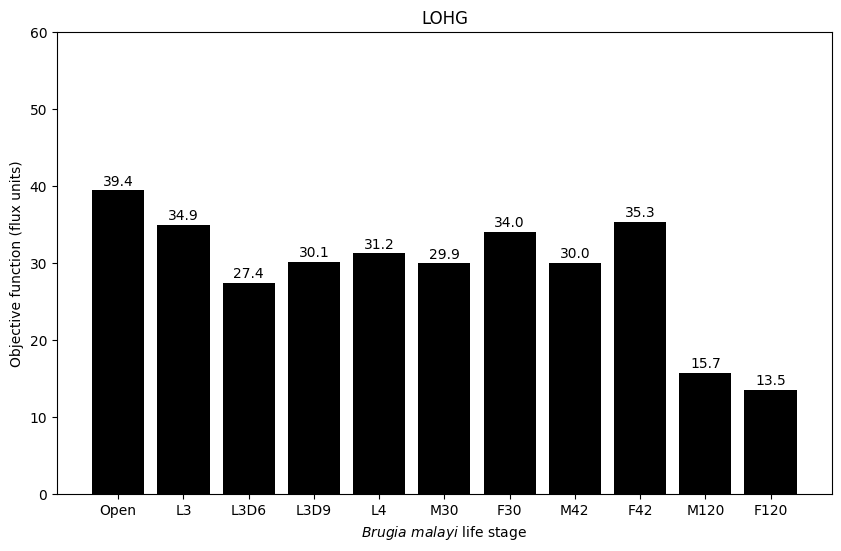

In [ ]:
import matplotlib.pyplot as plt

x_labels = ['Open', 'L3', 'L3D6', 'L3D9', 'L4', 'M30', 'F30', 'M42', 'F42', 'M120', 'F120']
y_values = [LOHG_Open[0], LOHG_L3[0], LOHG_L3D6[0], LOHG_L3D9[0], LOHG_L4[0], LOHG_M30[0], LOHG_F30[0], LOHG_M42[0], LOHG_F42[0], LOHG_M120[0], LOHG_F120[0]]

x = range(len(x_labels))
width = 0.8

plt.figure(figsize=(10, 6))
bars = plt.bar(x, y_values, width, color='black')

plt.xlabel(r'$\mathit{Brugia\ malayi}$ life stage')
plt.ylabel('Objective function (flux units)')
plt.title('LOHG')
plt.xticks(x, x_labels)
plt.yticks(range(0, 61, 10))

for bar, y_value in zip(bars, y_values):
    plt.text((bar.get_x() + bar.get_width() / 2), (y_value + 0.3), (y_value), ha='center', va='bottom', color='black')

plt.show()

## LOLG

In [ ]:
import numpy as np
import cobra

wolbachia_weights = np.arange(0, 1, 0.01)

LOLG_Open = []
LOLG_L3 = []
LOLG_L3D6 = []
LOLG_L3D9 = []
LOLG_L4 = []
LOLG_M30 = []
LOLG_F30 = []
LOLG_M42 = []
LOLG_F42 = []
LOLG_M120 = []
LOLG_F120 = []

for weight in wolbachia_weights:
    wolbachia_coefficient = weight

    glucose_reaction = bm_6_open.reactions.get_by_id("CARBON_SOURCE")
    glucose_reaction.lower_bound = 0
    glucose_reaction.upper_bound = 45

    oxygen_reaction = bm_6_open.reactions.get_by_id("DIFFUSION_2")
    oxygen_reaction.lower_bound = 0
    oxygen_reaction.upper_bound = 90

    biomass_reaction = bm_6_open.reactions.get_by_id("BIOMASS_SCALED")
    biomass_reaction.lower_bound = 0
    biomass_reaction.upper_bound = 1000

    open_solution = bm_6_open.optimize()
    open_objective_value = round(open_solution.objective_value, 1)

    L3_solution = bm_6_L3.optimize()
    L3_objective_value = round(L3_solution.objective_value, 1)

    L3D6_solution = bm_6_L3D6.optimize()
    L3D6_objective_value = round(L3D6_solution.objective_value, 1)

    L3D9_solution = bm_6_L3D9.optimize()
    L3D9_objective_value = round(L3D9_solution.objective_value, 1)

    L4_solution = bm_6_L4.optimize()
    L4_objective_value = round(L4_solution.objective_value, 1)

    M30_solution = bm_6_M30.optimize()
    M30_objective_value = round(M30_solution.objective_value, 1)

    F30_solution = bm_6_F30.optimize()
    F30_objective_value = round(F30_solution.objective_value, 1)

    M42_solution = bm_6_M42.optimize()
    M42_objective_value = round(M42_solution.objective_value, 1)

    F42_solution = bm_6_F42.optimize()
    F42_objective_value = round(F42_solution.objective_value, 1)

    M120_solution = bm_6_M120.optimize()
    M120_objective_value = round(M120_solution.objective_value, 1)

    F120_solution = bm_6_F120.optimize()
    F120_objective_value = round(F120_solution.objective_value, 1)

LOLG_Open.append(open_objective_value)
LOLG_L3.append(L3_objective_value)
LOLG_L3D6.append(L3D6_objective_value)
LOLG_L3D9.append(L3D9_objective_value)
LOLG_L4.append(L4_objective_value)
LOLG_M30.append(M30_objective_value)
LOLG_F30.append(F30_objective_value)
LOLG_M42.append(M42_objective_value)
LOLG_F42.append(F42_objective_value)
LOLG_M120.append(M120_objective_value)
LOLG_F120.append(F120_objective_value)

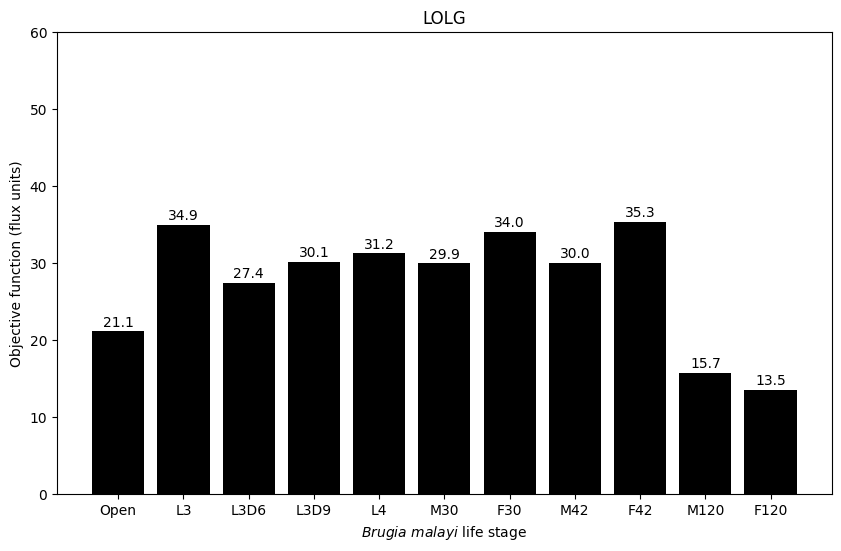

In [ ]:
import matplotlib.pyplot as plt

x_labels = ['Open', 'L3', 'L3D6', 'L3D9', 'L4', 'M30', 'F30', 'M42', 'F42', 'M120', 'F120']
y_values = [LOLG_Open[0], LOLG_L3[0], LOLG_L3D6[0], LOLG_L3D9[0], LOLG_L4[0], LOLG_M30[0], LOLG_F30[0], LOLG_M42[0], LOLG_F42[0], LOLG_M120[0], LOLG_F120[0]]

x = range(len(x_labels))
width = 0.8

plt.figure(figsize=(10, 6))
bars = plt.bar(x, y_values, width, color='black')

plt.xlabel(r'$\mathit{Brugia\ malayi}$ life stage')
plt.ylabel('Objective function (flux units)')
plt.title('LOLG')
plt.xticks(x, x_labels)
plt.yticks(range(0, 61, 10))

for bar, y_value in zip(bars, y_values):
    plt.text((bar.get_x() + bar.get_width() / 2), (y_value + 0.3), (y_value), ha='center', va='bottom', color='black')

plt.show()

# Figure 6

## HOHG

In [ ]:
import numpy as np
import cobra

wolbachia_weights = np.arange(0, 1, 0.01)

for weight in wolbachia_weights:
    wolbachia_coefficient = weight

    glucose_reaction = bm_6_open.reactions.get_by_id("CARBON_SOURCE")
    glucose_reaction.lower_bound = 0
    glucose_reaction.upper_bound = 250

    oxygen_reaction = bm_6_open.reactions.get_by_id("DIFFUSION_2")
    oxygen_reaction.lower_bound = 0
    oxygen_reaction.upper_bound = 580

    biomass_reaction = bm_6_open.reactions.get_by_id("BIOMASS_SCALED")
    biomass_reaction.lower_bound = 0
    biomass_reaction.upper_bound = 1000

    open_solution = bm_6_open.optimize()
    open_fluxes = open_solution.fluxes

    L3_solution = bm_6_L3.optimize()
    L3_fluxes = L3_solution.fluxes

    L3D6_solution = bm_6_L3D6.optimize()
    L3D6_fluxes = L3D6_solution.fluxes

    L3D9_solution = bm_6_L3D9.optimize()
    L3D9_fluxes = L3D9_solution.fluxes

    L4_solution = bm_6_L4.optimize()
    L4_fluxes = L4_solution.fluxes

    M30_solution = bm_6_M30.optimize()
    M30_fluxes = M30_solution.fluxes

    F30_solution = bm_6_F30.optimize()
    F30_fluxes = F30_solution.fluxes

    M42_solution = bm_6_M42.optimize()
    M42_fluxes = M42_solution.fluxes

    F42_solution = bm_6_F42.optimize()
    F42_fluxes = F42_solution.fluxes

    M120_solution = bm_6_M120.optimize()
    M120_fluxes = M120_solution.fluxes

    F120_solution = bm_6_F120.optimize()
    F120_fluxes = F120_solution.fluxes

## HOHG Cytosol

In [ ]:
def count_reactions_with_flux(solution, model, fluxes):
    reaction_count = 0
    for reaction_id in fluxes.index:
        reaction = model.reactions.get_by_id(reaction_id)
        metabolites = reaction.metabolites
        for metabolite in metabolites:
            if metabolite.compartment == 'c' and fluxes[reaction_id] != 0:
                reaction_count += 1
                break
    return reaction_count

HOHG_Open_C = []
HOHG_L3_C = []
HOHG_L3D6_C = []
HOHG_L3D9_C = []
HOHG_L4_C = []
HOHG_M30_C = []
HOHG_F30_C = []
HOHG_M42_C = []
HOHG_F42_C = []
HOHG_M120_C = []
HOHG_F120_C = []

open_reaction_count = count_reactions_with_flux(open_solution, bm_6_open, open_fluxes)
L3_reaction_count = count_reactions_with_flux(L3_solution, bm_6_L3, L3_fluxes)
L3D6_reaction_count = count_reactions_with_flux(L3D6_solution, bm_6_L3D6, L3D6_fluxes)
L3D9_reaction_count = count_reactions_with_flux(L3D9_solution, bm_6_L3D9, L3D9_fluxes)
L4_reaction_count = count_reactions_with_flux(L4_solution, bm_6_L4, L4_fluxes)
M30_reaction_count = count_reactions_with_flux(M30_solution, bm_6_M30, M30_fluxes)
F30_reaction_count = count_reactions_with_flux(F30_solution, bm_6_F30, F30_fluxes)
M42_reaction_count = count_reactions_with_flux(M42_solution, bm_6_M42, M42_fluxes)
F42_reaction_count = count_reactions_with_flux(F42_solution, bm_6_F42, F42_fluxes)
M120_reaction_count = count_reactions_with_flux(M120_solution, bm_6_M120, M120_fluxes)
F120_reaction_count = count_reactions_with_flux(F120_solution, bm_6_F120, F120_fluxes)

HOHG_Open_C.append(open_reaction_count)
HOHG_L3_C.append(L3_reaction_count)
HOHG_L3D6_C.append(L3D6_reaction_count)
HOHG_L3D9_C.append(L3D9_reaction_count)
HOHG_L4_C.append(L4_reaction_count)
HOHG_M30_C.append(M30_reaction_count)
HOHG_F30_C.append(F30_reaction_count)
HOHG_M42_C.append(M42_reaction_count)
HOHG_F42_C.append(F42_reaction_count)
HOHG_M120_C.append(M120_reaction_count)
HOHG_F120_C.append(F120_reaction_count)

## HOHG Mitochondria

In [ ]:
def count_reactions_with_flux(solution, model, fluxes):
    reaction_count = 0
    for reaction_id in fluxes.index:
        reaction = model.reactions.get_by_id(reaction_id)
        metabolites = reaction.metabolites
        for metabolite in metabolites:
            if metabolite.compartment == 'm' and fluxes[reaction_id] != 0:
                reaction_count += 1
                break
    return reaction_count

HOHG_Open_M = []
HOHG_L3_M = []
HOHG_L3D6_M = []
HOHG_L3D9_M = []
HOHG_L4_M = []
HOHG_M30_M = []
HOHG_F30_M = []
HOHG_M42_M = []
HOHG_F42_M = []
HOHG_M120_M = []
HOHG_F120_M = []

open_reaction_count = count_reactions_with_flux(open_solution, bm_6_open, open_fluxes)
L3_reaction_count = count_reactions_with_flux(L3_solution, bm_6_L3, L3_fluxes)
L3D6_reaction_count = count_reactions_with_flux(L3D6_solution, bm_6_L3D6, L3D6_fluxes)
L3D9_reaction_count = count_reactions_with_flux(L3D9_solution, bm_6_L3D9, L3D9_fluxes)
L4_reaction_count = count_reactions_with_flux(L4_solution, bm_6_L4, L4_fluxes)
M30_reaction_count = count_reactions_with_flux(M30_solution, bm_6_M30, M30_fluxes)
F30_reaction_count = count_reactions_with_flux(F30_solution, bm_6_F30, F30_fluxes)
M42_reaction_count = count_reactions_with_flux(M42_solution, bm_6_M42, M42_fluxes)
F42_reaction_count = count_reactions_with_flux(F42_solution, bm_6_F42, F42_fluxes)
M120_reaction_count = count_reactions_with_flux(M120_solution, bm_6_M120, M120_fluxes)
F120_reaction_count = count_reactions_with_flux(F120_solution, bm_6_F120, F120_fluxes)

HOHG_Open_M.append(open_reaction_count)
HOHG_L3_M.append(L3_reaction_count)
HOHG_L3D6_M.append(L3D6_reaction_count)
HOHG_L3D9_M.append(L3D9_reaction_count)
HOHG_L4_M.append(L4_reaction_count)
HOHG_M30_M.append(M30_reaction_count)
HOHG_F30_M.append(F30_reaction_count)
HOHG_M42_M.append(M42_reaction_count)
HOHG_F42_M.append(F42_reaction_count)
HOHG_M120_M.append(M120_reaction_count)
HOHG_F120_M.append(F120_reaction_count)

## HOHG Wolbachia

In [ ]:
def count_reactions_with_flux(solution, model, fluxes):
    reaction_count = 0
    for reaction_id in fluxes.index:
        reaction = model.reactions.get_by_id(reaction_id)
        metabolites = reaction.metabolites
        for metabolite in metabolites:
            if metabolite.compartment == 'w' and fluxes[reaction_id] != 0:
                reaction_count += 1
                break
    return reaction_count

HOHG_Open_W = []
HOHG_L3_W = []
HOHG_L3D6_W = []
HOHG_L3D9_W = []
HOHG_L4_W = []
HOHG_M30_W = []
HOHG_F30_W = []
HOHG_M42_W = []
HOHG_F42_W = []
HOHG_M120_W = []
HOHG_F120_W = []

open_reaction_count = count_reactions_with_flux(open_solution, bm_6_open, open_fluxes)
L3_reaction_count = count_reactions_with_flux(L3_solution, bm_6_L3, L3_fluxes)
L3D6_reaction_count = count_reactions_with_flux(L3D6_solution, bm_6_L3D6, L3D6_fluxes)
L3D9_reaction_count = count_reactions_with_flux(L3D9_solution, bm_6_L3D9, L3D9_fluxes)
L4_reaction_count = count_reactions_with_flux(L4_solution, bm_6_L4, L4_fluxes)
M30_reaction_count = count_reactions_with_flux(M30_solution, bm_6_M30, M30_fluxes)
F30_reaction_count = count_reactions_with_flux(F30_solution, bm_6_F30, F30_fluxes)
M42_reaction_count = count_reactions_with_flux(M42_solution, bm_6_M42, M42_fluxes)
F42_reaction_count = count_reactions_with_flux(F42_solution, bm_6_F42, F42_fluxes)
M120_reaction_count = count_reactions_with_flux(M120_solution, bm_6_M120, M120_fluxes)
F120_reaction_count = count_reactions_with_flux(F120_solution, bm_6_F120, F120_fluxes)

HOHG_Open_W.append(open_reaction_count)
HOHG_L3_W.append(L3_reaction_count)
HOHG_L3D6_W.append(L3D6_reaction_count)
HOHG_L3D9_W.append(L3D9_reaction_count)
HOHG_L4_W.append(L4_reaction_count)
HOHG_M30_W.append(M30_reaction_count)
HOHG_F30_W.append(F30_reaction_count)
HOHG_M42_W.append(M42_reaction_count)
HOHG_F42_W.append(F42_reaction_count)
HOHG_M120_W.append(M120_reaction_count)
HOHG_F120_W.append(F120_reaction_count)

## visualize

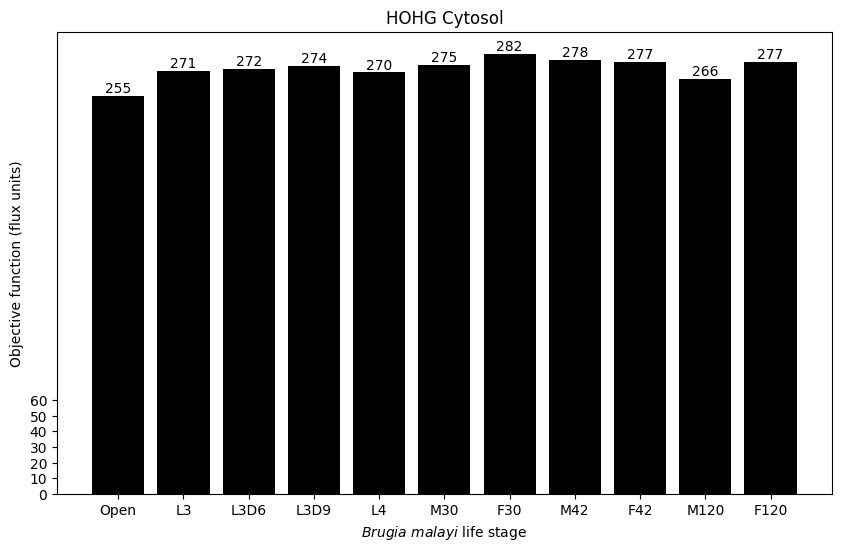

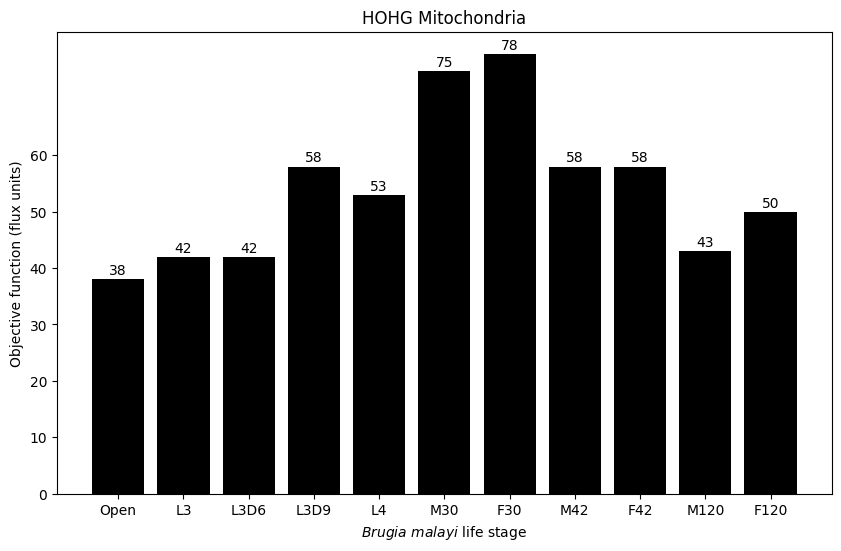

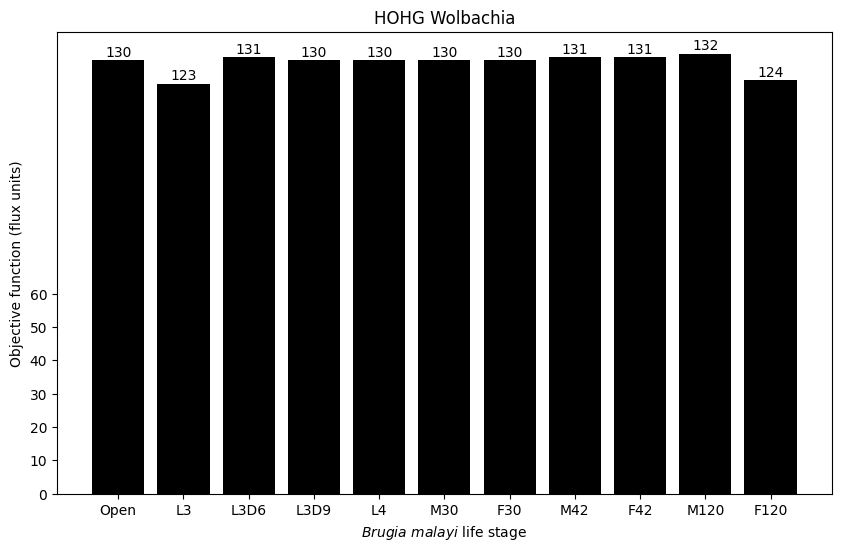

In [ ]:
import matplotlib.pyplot as plt

#Cytosol---------

x_labels = ['Open', 'L3', 'L3D6', 'L3D9', 'L4', 'M30', 'F30', 'M42', 'F42', 'M120', 'F120']
y_values = [HOHG_Open_C[0], HOHG_L3_C[0], HOHG_L3D6_C[0], HOHG_L3D9_C[0], HOHG_L4_C[0], HOHG_M30_C[0], HOHG_F30_C[0], HOHG_M42_C[0], HOHG_F42_C[0], HOHG_M120_C[0], HOHG_F120_C[0]]

x = range(len(x_labels))
width = 0.8

plt.figure(figsize=(10, 6))
bars = plt.bar(x, y_values, width, color='black')

plt.xlabel(r'$\mathit{Brugia\ malayi}$ life stage')
plt.ylabel('Objective function (flux units)')
plt.title('HOHG Cytosol')
plt.xticks(x, x_labels)
plt.yticks(range(0, 61, 10))

for bar, y_value in zip(bars, y_values):
    plt.text((bar.get_x() + bar.get_width() / 2), (y_value + 0.3), (y_value), ha='center', va='bottom', color='black')

#Mitochondria---------

x_labels = ['Open', 'L3', 'L3D6', 'L3D9', 'L4', 'M30', 'F30', 'M42', 'F42', 'M120', 'F120']
y_values = [HOHG_Open_M[0], HOHG_L3_M[0], HOHG_L3D6_M[0], HOHG_L3D9_M[0], HOHG_L4_M[0], HOHG_M30_M[0], HOHG_F30_M[0], HOHG_M42_M[0], HOHG_F42_M[0], HOHG_M120_M[0], HOHG_F120_M[0]]

x = range(len(x_labels))
width = 0.8

plt.figure(figsize=(10, 6))
bars = plt.bar(x, y_values, width, color='black')

plt.xlabel(r'$\mathit{Brugia\ malayi}$ life stage')
plt.ylabel('Objective function (flux units)')
plt.title('HOHG Mitochondria')
plt.xticks(x, x_labels)
plt.yticks(range(0, 61, 10))

for bar, y_value in zip(bars, y_values):
    plt.text((bar.get_x() + bar.get_width() / 2), (y_value + 0.3), (y_value), ha='center', va='bottom', color='black')

#Wolbachia---------

x_labels = ['Open', 'L3', 'L3D6', 'L3D9', 'L4', 'M30', 'F30', 'M42', 'F42', 'M120', 'F120']
y_values = [HOHG_Open_W[0], HOHG_L3_W[0], HOHG_L3D6_W[0], HOHG_L3D9_W[0], HOHG_L4_W[0], HOHG_M30_W[0], HOHG_F30_W[0], HOHG_M42_W[0], HOHG_F42_W[0], HOHG_M120_W[0], HOHG_F120_W[0]]

x = range(len(x_labels))
width = 0.8

plt.figure(figsize=(10, 6))
bars = plt.bar(x, y_values, width, color='black')

plt.xlabel(r'$\mathit{Brugia\ malayi}$ life stage')
plt.ylabel('Objective function (flux units)')
plt.title('HOHG Wolbachia')
plt.xticks(x, x_labels)
plt.yticks(range(0, 61, 10))

for bar, y_value in zip(bars, y_values):
    plt.text((bar.get_x() + bar.get_width() / 2), (y_value + 0.3), (y_value), ha='center', va='bottom', color='black')



plt.show()